In [2]:
import pandas as pd

aligned_result_r5 = pd.read_csv('./round05_election_result_aligned.csv')
aligned_result_r5_df = pd.DataFrame(aligned_result_r5, columns=['광역시도', 'hannara_rate', 'minju_rate', 'gita_rate'])
aligned_result_r6 = pd.read_csv('./round06_election_result_aligned.csv')
aligned_result_r6_df = pd.DataFrame(aligned_result_r6, columns=['광역시도', 'minju_rate', 'saenuri_rate', 'gita_rate'])
aligned_result_r7 = pd.read_csv('./round07_election_result_aligned.csv')
aligned_result_r7_df = pd.DataFrame(aligned_result_r7, columns=['광역시도', 'minju_rate', 'hanguk_rate', 'gita_rate'])

# print(aligned_result_r5_df, '\n')
# print(aligned_result_r6_df, '\n')
# print(aligned_result_r7_df)

In [3]:
rnd_list = ['r5', 'r6', 'r7']
party_list = ['jinbo_1dang', 'bosu_1dang', 'gita_dang']
province_list = ['Gangwon', 'Gyeonggi', 'Gyeongnam', 'Gyeongbuk', 'Gwangju', 'Daegu',
           'Daejeon', 'Busan', 'Seoul', 'Sejong', 'Ulsan', 'Incheon', 'Jeonnam', 
            'Jeonbuk', 'Jeju', 'Chungnam', 'Chungbuk']

province_old_list = province_list.copy()
province_old_list.remove('Sejong')

final_row_list = []
for i in rnd_list:
    for j in party_list:
        if(i == 'r5'):
            p_list = province_old_list
        else:
            p_list = province_list
        
        for k in p_list:
            final_row_list.append(i + '_' + j + '_' + k)
     
arr_r5 = aligned_result_r5_df.values.copy()
arr_r5.resize(16*4, 1)
arr_r5_list = [arr_r5[i] for i in range(16*4) if i%4 != 0]
arr_r5_list_df = pd.DataFrame(arr_r5_list)

arr_r6 = aligned_result_r6_df.values.copy()
arr_r6.resize(17*4, 1)
arr_r6_list = [arr_r6[i] for i in range(17*4) if i%4 != 0]
arr_r6_list_df = pd.DataFrame(arr_r6_list)

arr_r7 = aligned_result_r7_df.values.copy()
arr_r7.resize(17*4, 1)
arr_r7_list = [arr_r7[i] for i in range(17*4) if i%4 != 0]
arr_r7_list_df = pd.DataFrame(arr_r7_list)

final_row_value_df = pd.concat([arr_r5_list_df, arr_r6_list_df, arr_r7_list_df])
final_row_value_df.index = final_row_list
final_row_value_df.columns = ['rate']
final_row_value_df

,rate
r5_jinbo_1dang_Gangwon,0.439666
r5_jinbo_1dang_Gyeonggi,0.523703
r5_jinbo_1dang_Gyeongnam,0.036631
r5_jinbo_1dang_Gyeongbuk,0.500906
r5_jinbo_1dang_Gwangju,0.458654
...,...
r7_gita_dang_Jeonnam,0.341666
r7_gita_dang_Jeonbuk,0.049434
r7_gita_dang_Jeju,0.599182
r7_gita_dang_Chungnam,0.290638


In [4]:
import sys
import numpy as np

def KL(P,Q):
    epsilon = 1e-10

    # You may want to instead make copies to avoid changing the np arrays.
    if P == 0:
        P = P+epsilon
    if Q == 0:
        Q = Q+epsilon

#     divergence = np.sum(P*np.log(P/Q))
    divergence = P*np.log(P/Q)
    return divergence

def SKL(P,Q):
    epsilon = 1e-10

    # You may want to instead make copies to avoid changing the np arrays.
    if P == 0:
        P = P+epsilon
    if Q == 0:
        Q = Q+epsilon

#     divergence = np.sum(P*np.log(P/Q))
    divergence = 0.5*(P*np.log(P/Q) + Q*np.log(Q/P))
    return divergence

def CE(P,Q):
    epsilon = 1e-10

    # You may want to instead make copies to avoid changing the np arrays.
#     if P == 0:
    P = P+epsilon
#     if Q == 0:
    Q = Q+epsilon

    ce = -P*np.log(Q)
    return ce

data_list = final_row_value_df.rate.to_list()
# print(len(data_list))
KL_result = []
CE_result = []
SKL_result = []
for a in data_list:
    for b in data_list:
        KL_result.append(KL(a, b))
        CE_result.append(CE(a, b))
        SKL_result.append(SKL(a, b))

# print(KL_result)
KL_result_reshaped = np.reshape(KL_result, (150,150))
CE_result_reshaped = np.reshape(CE_result, (150,150))
SKL_result_reshaped = np.reshape(SKL_result, (150,150))

KL_result_df = pd.DataFrame(KL_result_reshaped)
KL_result_df.index = final_row_list
KL_result_df.columns = final_row_list
# KL_result_df

CE_result_df = pd.DataFrame(CE_result_reshaped)
CE_result_df.index = final_row_list
CE_result_df.columns = final_row_list

SKL_result_df = pd.DataFrame(SKL_result_reshaped)
SKL_result_df.index = final_row_list
SKL_result_df.columns = final_row_list


# CE_result_df
# KL_result_df
SKL_result_df

,r5_jinbo_1dang_Gangwon,r5_jinbo_1dang_Gyeonggi,r5_jinbo_1dang_Gyeongnam,r5_jinbo_1dang_Gyeongbuk,r5_jinbo_1dang_Gwangju,r5_jinbo_1dang_Daegu,r5_jinbo_1dang_Daejeon,r5_jinbo_1dang_Busan,r5_jinbo_1dang_Seoul,r5_jinbo_1dang_Ulsan,...,r7_gita_dang_Busan,r7_gita_dang_Seoul,r7_gita_dang_Sejong,r7_gita_dang_Ulsan,r7_gita_dang_Incheon,r7_gita_dang_Jeonnam,r7_gita_dang_Jeonbuk,r7_gita_dang_Jeju,r7_gita_dang_Chungnam,r7_gita_dang_Chungbuk
r5_jinbo_1dang_Gangwon,0.000000,0.007349,0.500797,0.003993,0.000401,0.476315,0.000282,4.881199,0.011196,0.071314,...,0.031563,0.002625,0.533863,0.018165,0.027554,0.012357,0.426402,0.024689,0.030844,0.227990
r5_jinbo_1dang_Gyeonggi,0.007349,0.000000,0.647814,0.000507,0.004314,0.618842,0.004749,5.859979,0.000402,0.032708,...,0.069696,0.018781,0.686921,0.002399,0.006421,0.038873,0.559704,0.005081,0.068619,0.322304
r5_jinbo_1dang_Gyeongnam,0.500797,0.647814,0.000000,0.607161,0.533312,0.000188,0.527994,0.361162,0.685244,1.027306,...,0.260784,0.422726,0.000309,0.741240,0.804256,0.340563,0.001919,0.786074,0.263049,0.040496
r5_jinbo_1dang_Gyeongbuk,0.003993,0.000507,0.607161,0.000000,0.001862,0.579402,0.002151,5.593741,0.001814,0.041399,...,0.058210,0.013104,0.644637,0.005114,0.010542,0.030461,0.522753,0.008803,0.057228,0.295840
r5_jinbo_1dang_Gwangju,0.000401,0.004314,0.533312,0.001862,0.000000,0.507811,0.000010,5.101701,0.007353,0.060938,...,0.039127,0.005080,0.567750,0.013157,0.021287,0.017224,0.455801,0.018779,0.038326,0.248495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
r7_gita_dang_Jeonnam,0.012357,0.038873,0.340563,0.030461,0.017224,0.321409,0.016385,3.750113,0.047236,0.144139,...,0.004391,0.003585,0.366474,0.060741,0.077207,0.000000,0.282470,0.072328,0.004127,0.130990
r7_gita_dang_Jeonbuk,0.426402,0.559704,0.001919,0.522753,0.455801,0.000903,0.450989,0.494804,0.593779,0.906959,...,0.211639,0.356053,0.003776,0.644840,0.702413,0.282470,0.000000,0.685790,0.213639,0.024343
r7_gita_dang_Jeju,0.024689,0.005081,0.786074,0.008803,0.018779,0.753112,0.019677,6.744895,0.002623,0.011974,...,0.112994,0.043506,0.830556,0.000497,0.000078,0.072328,0.685790,0.000000,0.111614,0.414053
r7_gita_dang_Chungnam,0.030844,0.068619,0.263049,0.057228,0.038326,0.246727,0.037064,3.166530,0.079650,0.198453,...,0.000004,0.015427,0.285164,0.097023,0.117689,0.004127,0.213639,0.111614,0.000000,0.087520


In [5]:
# # KL_result_df.to_csv('./KL_result_df.csv', encoding='utf-8',  sep=',')
# CE_result_df.to_csv('./CE_result_df.csv', encoding='utf-8',  sep=',')
# SKL_result_df.to_csv('./SKL_result_df.csv', encoding='utf-8',  sep=',')

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(300,300))
sns.heatmap(SKL_result_df, annot=True)
plt.show()

(150, 150)
(150,)
(150, 150)


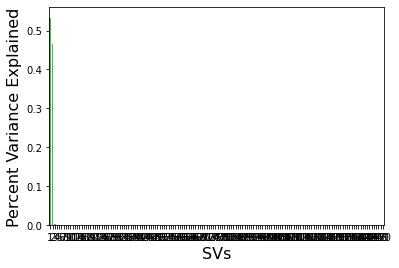

In [11]:
u, s, v = np.linalg.svd(SKL_result_df, full_matrices=True)
print(u.shape)
print(s.shape)
print(v.shape)

var_explained = np.round(s**2/np.sum(s**2), decimals=3)
var_explained
 
sns.barplot(x=list(range(1,len(var_explained)+1)),
            y=var_explained, color="limegreen")
plt.xlabel('SVs', fontsize=16)
plt.ylabel('Percent Variance Explained', fontsize=16)
plt.savefig('svd_scree_plot.png',dpi=1000)

In [30]:
# print(u, '\n')
# print(np.diag(s, 1)[:, 1:], '\n')
# print(v, '\n','\n')

S = np.zeros(SKL_result_df.shape)
for i in range(len(s)):
    S[i][i] = s[i]

S0 = np.zeros(SKL_result_df.shape)
S0[0][0] = s[0]
# print(S0)

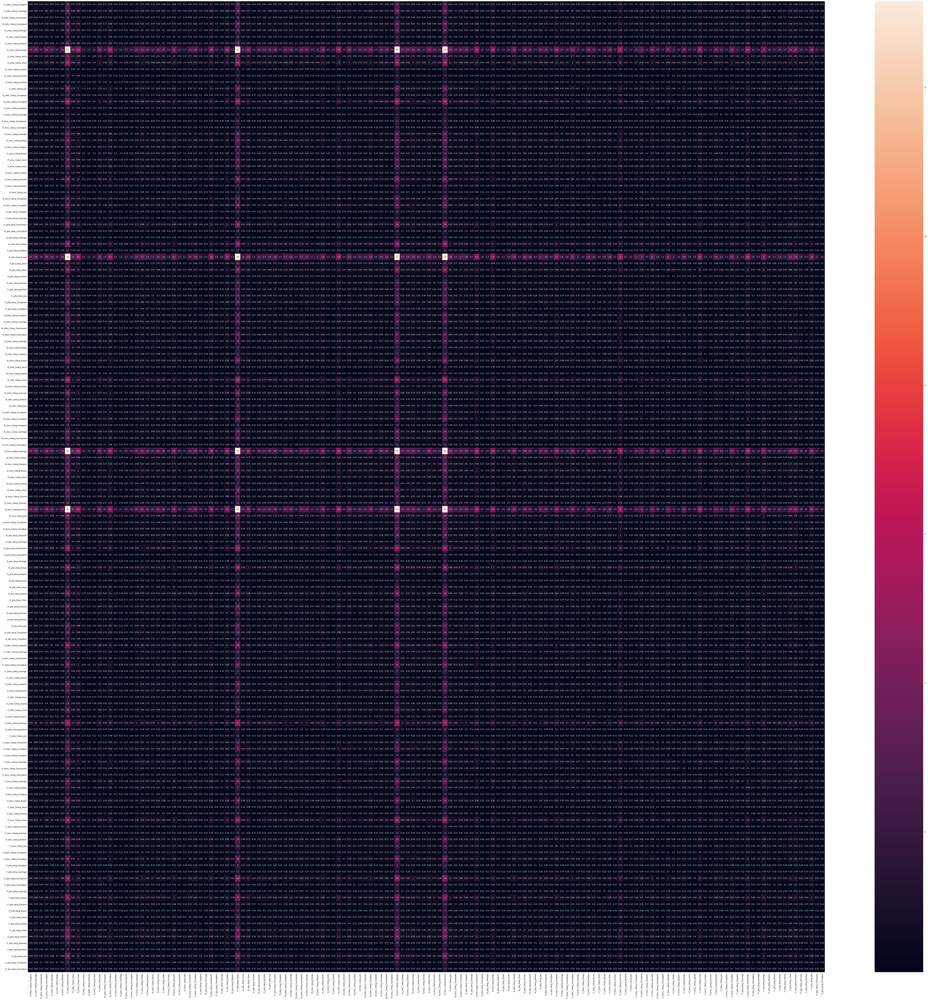

In [38]:
appA = np.dot(u, np.dot(S, v))
appA0 = np.dot(u, np.dot(S0, v))
# print(SKL_result_df - appA)
# print(SKL_result_df - appA0)

appA0_df = pd.DataFrame(appA0)
appA0_df.index = final_row_list
appA0_df.columns = final_row_list
plt.figure(figsize=(100,100))
sns.heatmap(appA0_df, annot=True)
plt.show()